In [11]:
suppressMessages(library(ggplot2))
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(pheatmap))
suppressMessages(library(SummarizedExperiment))
suppressMessages(library(ArchR))
library(RColorBrewer)

In [12]:
epi_cnaObj <- readRDS("./ArchRProject_epithelial/epithelial_cna.rds")

In [13]:
epi_cnaObj

class: RangedSummarizedExperiment 
dim: 1190 6894 
metadata(0):
assays(8): CNA counts ... bdgMean bdgSd
rownames: NULL
rowData names(6): name effectiveLength ... AT N
colnames(6894): CTCGCTAGTTTCGTTT-1 GAAGTCTCAGAAAGAG-1 ...
  TAAACCGCAACGCAAG-1 CATAACGCAACGAGGT-1
colData names(0):

In [14]:
metadata <- read.csv("./ArchRProject_epithelial/metadata.csv")

In [15]:
# 去除 metadata$X 中的样本前缀
metadata$X <- sub("^.*#", "", metadata$X) 

In [16]:
CNA_matrix <- t(assay(epi_cnaObj, "CNA"))
cellInfo <- metadata[match(rownames(CNA_matrix), metadata$X),]
cellInfo

,X,Sample,type,clusters,neoadjuvant
,<chr>,<chr>,<chr>,<chr>,<chr>
177,CTCGCTAGTTTCGTTT-1,11T,LuminalB,C14,after_neoadjuvant
55,GAAGTCTCAGAAAGAG-1,11T,LuminalB,C10,after_neoadjuvant
187,CACCTGTAGTAGTTCC-1,11T,LuminalB,C10,after_neoadjuvant
251,GGGTCTGTCCAGCACG-1,11T,LuminalB,C10,after_neoadjuvant
473,GCGGTGTGTAATGTAG-1,11T,LuminalB,C10,after_neoadjuvant
299,GTGCTGGCACATGATC-1,11T,LuminalB,C10,after_neoadjuvant
350,ACAAACCAGACACGGT-1,11T,LuminalB,C10,after_neoadjuvant
2,AGCTATGCAGGTGGTA-1,11T,LuminalB,C10,after_neoadjuvant
190,GCGCCAAAGTGCTAGG-1,11T,LuminalB,C10,after_neoadjuvant


In [17]:
getCNAHeatmap <- function(cnaObj, metadata, cols){
    CNA_matrix <- t(assay(cnaObj, "CNA"))
    windowSummary <- rowRanges(cnaObj)
    ## 添加annotation_col
    colnames(CNA_matrix)=paste0('windows_',1:ncol(CNA_matrix))
    annotation_col = data.frame(
        chr= factor(seqnames(windowSummary),
        levels = unique(seqnames(windowSummary)))
    )
    rownames(annotation_col) = colnames(CNA_matrix)
    ## 添加annotation_row
    cellInfo <- metadata[match(rownames(CNA_matrix), metadata$X),]
    annotation_row <- data.frame(
        type = factor(cellInfo$type, levels = c('LuminalB','LuminalB-HER2', 'Normal')),
        Sample = factor(cellInfo$Sample, levels = c("10N", "10T", "11T", "12N", "12T", "13T", "18T", "19T", "20T", "21T", "22T" )),
        clusters = factor(cellInfo$clusters, levels = paste0("C", 1:25))
    )
    rownames(annotation_row) = rownames(CNA_matrix)
    ## clusters 排序
    annotation_row <- annotation_row[order(annotation_row$clusters), ]
    CNA_matrix <- CNA_matrix[rownames(annotation_row), ]
    ## annotation_color
    ann_colors = list(
        chr = setNames(colorRampPalette(brewer.pal(10,  name = 'Paired'))(22), levels(annotation_col$chr)),
        Sample = setNames(brewer.pal(n = length(levels(annotation_row$Sample)), name = 'Set3'), levels(annotation_row$Sample)),
        type = setNames(brewer.pal(n = length(levels(annotation_row$type)), name = 'Set1'), levels(annotation_row$type)),
        clusters = setNames(colorRampPalette(brewer.pal(10,  name = 'Set3'))(25), levels(annotation_row$clusters))
    )
    # 绘制热图
    options(repr.plot.width=20, repr.plot.height=20)
    p1 <- pheatmap(
        CNA_matrix,
        annotation_col = annotation_col,
        col = cols,
        cluster_rows = FALSE, # 禁cnaObj止行聚类，因为我们已经手动排序了
        cluster_cols = FALSE,
        show_rownames = FALSE,
        show_colnames = FALSE,
        annotation_names_col = TRUE, # 显示注释标签
        annotation_row = annotation_row, # 添加行注释
        annotation_legend = TRUE, # 显示注释图例
        annotation_colors = ann_colors,
        gaps_row = cumsum(table(annotation_row$clusters)), # 绘制分割线
        gaps_col = cumsum(table(annotation_col$chr)) # 绘制分割线
    )

}

Warning message in brewer.pal(10, "OrRd"):
“n too large, allowed maximum for palette OrRd is 9
Returning the palette you asked for with that many colors
”


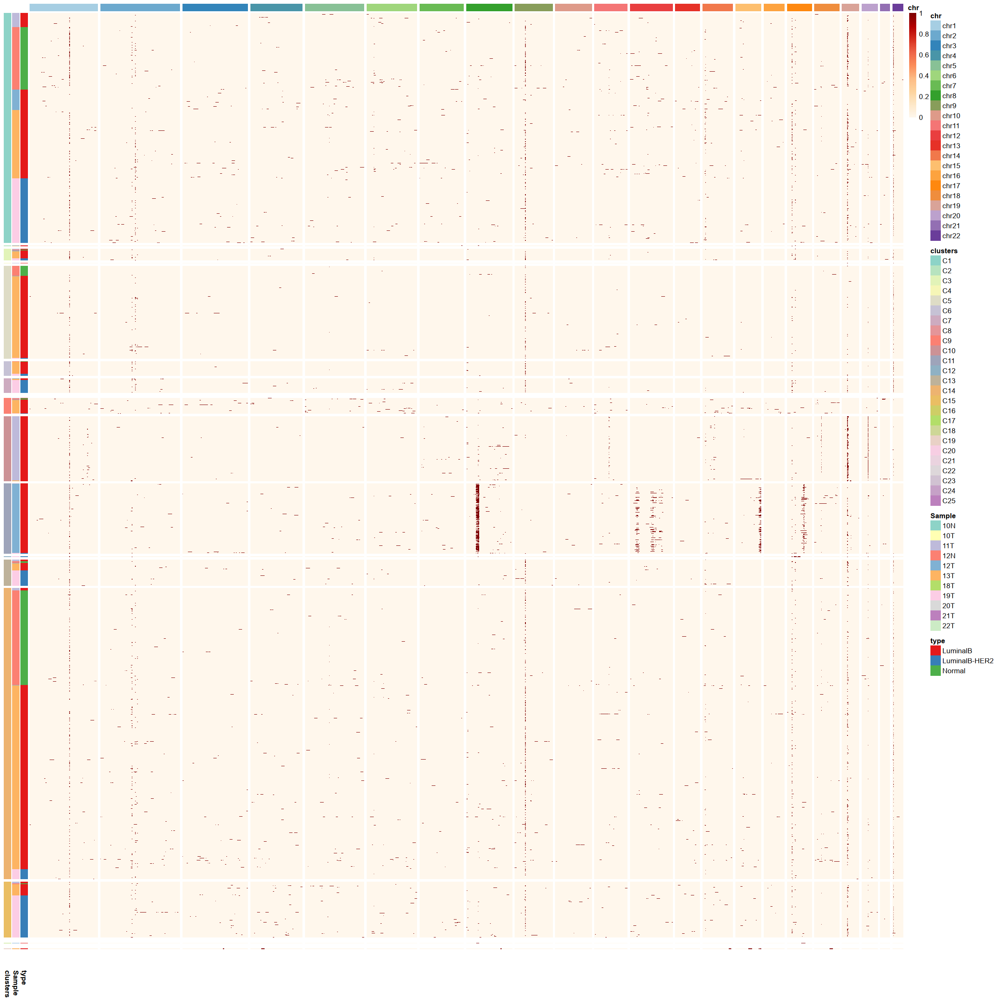

In [18]:
## heatmap color
cols <- colorRampPalette(brewer.pal(10, "OrRd"))(256)
getCNAHeatmap(epi_cnaObj, metadata, cols)

In [19]:
getLog2FCHeatmap <- function(cnaObj, metadata, cols){
    windowSummary <- rowRanges(cnaObj)
    log2FC_matrix <- assay(cnaObj, "log2FC")
    log2FC_matrix_normalized <- t(scale(log2FC_matrix))
    log2FC_matrix_clipped <- pmax(pmin(log2FC_matrix_normalized, 2), -2)
    ## 添加annotation_col
    colnames(log2FC_matrix_clipped)=paste0('windows_',1:ncol(log2FC_matrix_clipped))
    annotation_col = data.frame(
    chr= factor(seqnames(windowSummary),levels = unique(seqnames(windowSummary)))
    )
    rownames(annotation_col) = colnames(log2FC_matrix_clipped)
    ## 添加annotation_row
    cellInfo <- metadata[match(rownames(log2FC_matrix_clipped), metadata$X),]
    annotation_row <- data.frame(
        type = factor(cellInfo$type, levels = c('LuminalB','LuminalB-HER2', 'Normal')),
        Sample = factor(cellInfo$Sample, levels = c("10N", "10T", "11T", "12N", "12T", "13T", "18T", "19T", "20T", "21T", "22T" )),
        clusters = factor(cellInfo$clusters, levels = paste0("C", 1:25))
    )
    rownames(annotation_row) = rownames(log2FC_matrix_clipped)
    ## clusters 排序
    annotation_row <- annotation_row[order(annotation_row$clusters), ]
    log2FC_matrix_clipped <- log2FC_matrix_clipped[rownames(annotation_row), ]
    ## annotation_color
    ann_colors = list(
        chr = setNames(colorRampPalette(brewer.pal(10,  name = 'Paired'))(22), levels(annotation_col$chr)),
        Sample = setNames(brewer.pal(n = length(levels(annotation_row$Sample)), name = 'Set3'), levels(annotation_row$Sample)),
        type = setNames(brewer.pal(n = length(levels(annotation_row$type)), name = 'Set1'), levels(annotation_row$type)),
        clusters = setNames(colorRampPalette(brewer.pal(10,  name = 'Set3'))(25), levels(annotation_row$clusters))
    )
    # 绘制热图
    options(repr.plot.width=20, repr.plot.height=40)
    p1 <- pheatmap(
        log2FC_matrix_clipped,
        annotation_col = annotation_col,
        col = cols,
        cluster_rows = FALSE, # 禁止行聚类，因为我们已经手动排序了
        cluster_cols = FALSE,
        show_rownames = FALSE,
        show_colnames = FALSE,
        annotation_names_col = TRUE, # 显示注释标签
        annotation_row = annotation_row, # 添加行注释
        annotation_legend = TRUE, # 显示注释图例
        annotation_colors = ann_colors,
        gaps_row = cumsum(table(annotation_row$clusters)), # 绘制分割线
        gaps_col = cumsum(table(annotation_col$chr)) # 绘制分割线
    )
}

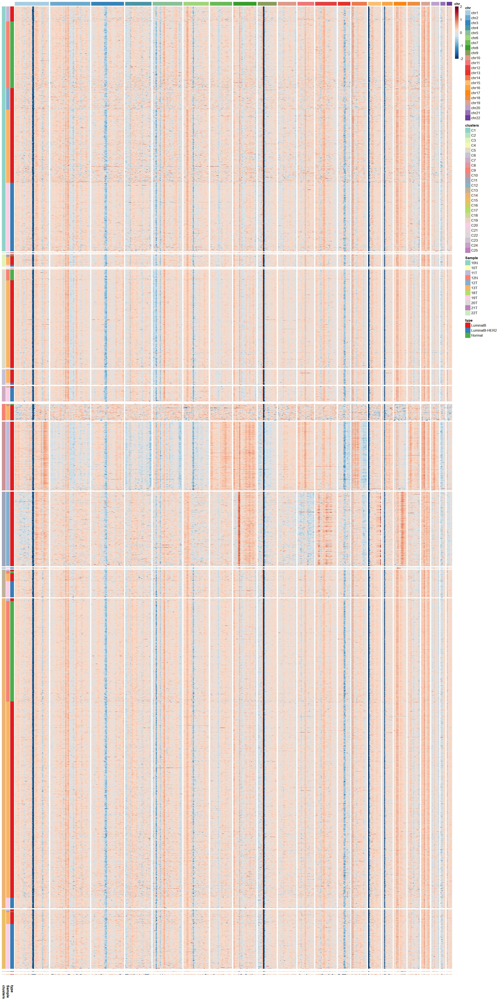

In [20]:
cols <- rev(colorRampPalette(brewer.pal(10, "RdBu"))(256))
getLog2FCHeatmap(epi_cnaObj, metadata, cols)